In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

# User config.

In [2]:
data_dir = '/home/ec2-user/tmp'  # e.g. '/home/ec2-user/misha/bdd100k_demo_data'

# Download data

### Download images from S3 storage

In [3]:
import os

import boto3

s3 = boto3.resource('s3', region_name='il-central-1')
bucket = s3.Bucket('hirundo-demo-data')
os.makedirs(data_dir, exist_ok=True)
filename  = 'demo_images.zip'
filepath = os.path.join(data_dir, filename)
bucket.download_file('BDD100K/demo_images.zip', filepath)

### Unzip images

In [4]:
import zipfile

with zipfile.ZipFile(filepath, 'r') as zip_ref:
    zip_ref.extractall(data_dir)

# Download high self-influence samples

In [5]:
import pandas as pd
from clearml import Task

task = Task.get_task('4567342d960545ed92c7a8ea28cc81d3')
filepath = task.artifacts['topk_self_influence_train_samples'].get_local_copy(force_download=True)
self_influence_samples = pd.read_csv(filepath)

2024-03-11 01:22:58,572 - clearml.storage - INFO - Downloading: 5.00MB / 6.37MB @ 36.96MBs from http://172.31.23.240:8081/Influence%20Research/BDD100K%20Classifier.4567342d960545ed92c7a8ea28cc81d3/artifacts/topk_self_influence_train_samples/topk_self_influence_train_samples.csv.gz
2024-03-11 01:22:58,590 - clearml.storage - INFO - Downloaded 6.37 MB successfully from http://172.31.23.240:8081/Influence%20Research/BDD100K%20Classifier.4567342d960545ed92c7a8ea28cc81d3/artifacts/topk_self_influence_train_samples/topk_self_influence_train_samples.csv.gz , saved to /home/ec2-user/.clearml/cache/storage_manager/global/c00c4d96772d0426ea9c6dc0b0bdfb3e.topk_self_influence_train_samples.csv.gz


# Filter top-k samples

In [6]:
from kneed import KneeLocator

kn = KneeLocator(range(self_influence_samples.shape[0]), self_influence_samples.self_influence, curve='convex', direction='decreasing')
self_influence_samples = self_influence_samples[:kn.knee]

# Plot images

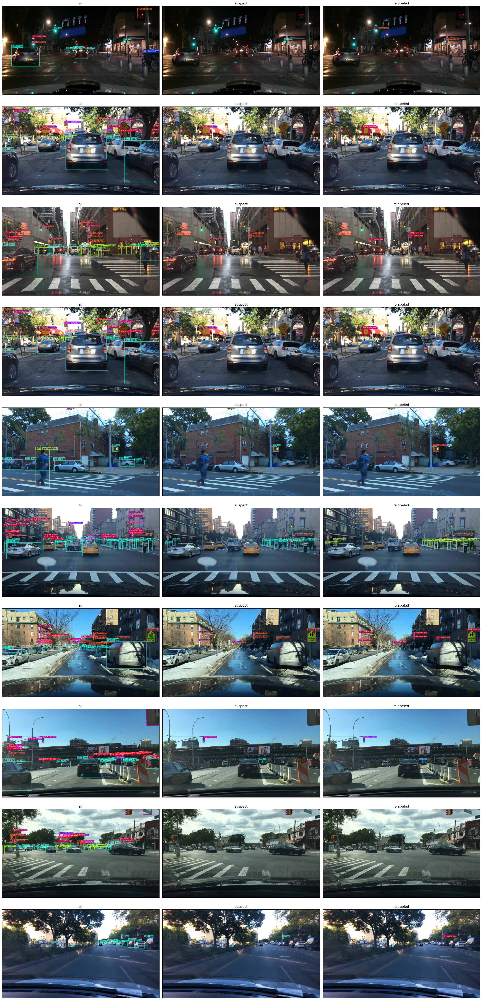

In [7]:
from matplotlib import pyplot as plt
from PIL import ImageFile

ImageFile.LOAD_TRUNCATED_IMAGES = True

topk = 10  # chose num. of samples to display

fig, axs = plt.subplots(nrows=topk, ncols=3, figsize=(24, 5 * topk), subplot_kw={'xticks': [], 'yticks': []})
for row,frame_idx  in enumerate(self_influence_samples.frame_idx[:topk]):
    for col, img_type in enumerate(['all', 'suspect', 'relabeled']):
        img = plt.imread(os.path.join(data_dir, 'demo_images', f'{img_type}_bboxes/{frame_idx}.png'))
        axs[row, col].imshow(img)
        axs[row, col].set_title(img_type)
plt.tight_layout()
plt.show()